In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, log_loss
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.benchmark as benchmark
import torch._dynamo
from torchinfo import summary
import seaborn as sns
from sklearn.datasets import fetch_covtype
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch
import torch
from torch import Tensor
from torch.optim import Optimizer



In [2]:
def zeropower_via_newtonschulz5(G: Tensor, steps: int) -> Tensor:
    assert G.ndim >= 2
    a, b, c = 3.4445, -4.7750, 2.0315
    X = G.clone().float()
    if G.size(-2) > G.size(-1):
        X = X.mT
    X = X / (X.norm(dim=(-2, -1), keepdim=True) + 1e-7)
    for _ in range(steps):
        A = X @ X.mT
        B = b * A + c * A @ A
        X = a * X + B @ X
    if G.size(-2) > G.size(-1):
        X = X.mT
    return X

class Muon(Optimizer):
    def __init__(self, params, lr=0.02, weight_decay=0.01, momentum=0.95, nesterov=True, ns_steps=5):
        defaults = dict(lr=lr, weight_decay=weight_decay, momentum=momentum, nesterov=nesterov, ns_steps=ns_steps)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self):
        for group in self.param_groups:
            lr = group["lr"]
            weight_decay = group["weight_decay"]
            momentum = group["momentum"]
            nesterov = group["nesterov"]
            ns_steps = group["ns_steps"]

            for p in group["params"]:
                if p.grad is None:
                    continue
                g = p.grad.data

                if g.ndim < 2:
                    continue  # skip scalars, biases, etc.

                state = self.state[p]
                if "momentum_buffer" not in state:
                    state["momentum_buffer"] = torch.zeros_like(g)

                buf = state["momentum_buffer"]
                buf.mul_(momentum).add_(g)

                if nesterov:
                    g = g + momentum * buf
                else:
                    g = buf

                if g.ndim == 4:
                    g = g.view(g.size(0), -1)

                g = zeropower_via_newtonschulz5(g, steps=ns_steps).view_as(p)

                p.mul_(1 - lr * weight_decay)
                p.add_(g, alpha=-lr)


In [3]:
torch._dynamo.config.cache_size_limit = 16

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
device = "cpu"

In [4]:
df = sns.load_dataset('diamonds')
df = df[['carat', 'depth', 'table', 'price', 'x', 'y', 'z', 'cut']]

df['cut'] = (df['cut'] == 'Ideal').astype(int)

X = df.drop('cut', axis=1)
y = df['cut']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long).to(device)

print(X.shape)
print(y.shape)

ideal_percentage = df['cut'].mean() * 100
print(f"Percentage of diamonds with 'Ideal' cut: {ideal_percentage:.2f}%")

model = LogisticRegression(penalty='l2', C=0.001, max_iter=10000)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

y_pred_proba = model.predict_proba(X_test)
loss = log_loss(y_test, y_pred_proba)

print(f"Test Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=['Not Ideal', 'Ideal']))
print(model.coef_)
print(f"Log Loss: {loss:.6f}")

(53940, 7)
(53940,)
Percentage of diamonds with 'Ideal' cut: 39.95%
Test Accuracy: 79.30%
Classification Report:
              precision    recall  f1-score   support

   Not Ideal       0.82      0.85      0.83      6496
       Ideal       0.75      0.71      0.73      4292

    accuracy                           0.79     10788
   macro avg       0.79      0.78      0.78     10788
weighted avg       0.79      0.79      0.79     10788

[[-0.15688782 -0.46189194 -1.57368125  0.22509094 -0.08309788 -0.03167662
  -0.08671039]]
Log Loss: 0.451068


/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: divide by zero encountered in matmul
  raw_prediction = X @ weights + intercept
/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: overflow encountered in matmul
  raw_prediction = X @ weights + intercept
/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: invalid value encountered in matmul
  raw_prediction = X @ weights + intercept
/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered

In [5]:
def train(model, criterion, optimizers):
    print(summary(model, input_data=X_train_tensor))

    torch.set_printoptions(threshold=float('inf'))
    for name, param in model.named_parameters():
        print(name)
        print(param)

    @torch._dynamo.explain
    def run_model(x):
        return model(x)

    run_model(X_train_tensor) # type: ignore

    epochs = 10000
    best_test_loss = float('inf')

    train_losses = []
    test_losses = []

    for epoch in range(epochs):
        model.train()
        for opt in optimizers:
            opt.zero_grad()

        train_outputs = model(X_train_tensor)
        train_loss = criterion(train_outputs, y_train_tensor)
        train_loss.backward()

        for opt in optimizers:
            opt.step()

        model.eval()
        with torch.no_grad():
            test_outputs = model(X_test_tensor)
            test_loss = criterion(test_outputs, y_test_tensor)
            test_predictions = torch.argmax(test_outputs, dim=1)
            test_accuracy = (test_predictions == y_test_tensor).sum().item() / y_test_tensor.size(0)

        train_losses.append(train_loss.item())
        test_losses.append(test_loss.item())

        if test_loss.item() < best_test_loss:
            best_test_loss = test_loss.item()

        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss.item():.8f}, Test Loss: {test_loss.item():.8f}, Test Accuracy: {test_accuracy:.4f}")

    print()
    print(f"Lowest Test Loss: {best_test_loss:.8f}")

    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Test Loss Over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()


In [18]:
class DiamondNN(nn.Module):
    def __init__(self, n, num_layers=3):
        super().__init__()
        self.bias = torch.nn.Parameter(torch.zeros(n))

        self.bns = nn.ModuleList()
        self.linears = nn.ModuleList()
        for i in range(num_layers):
            dim = n * (2**i)
            self.bns.append(nn.BatchNorm1d(dim * 2, affine=False))
            self.linears.append(nn.Linear(dim * 2, dim))

            with torch.no_grad():
                self.linears[i].weight.copy_(torch.eye(dim).repeat_interleave(2, dim=1)) # type: ignore
                nn.init.zeros_(self.linears[i].bias)                                     # type: ignore

        self.final_bn = nn.BatchNorm1d(2 * n * (2**num_layers), affine=False)
        self.final = nn.Linear((2 * n) * (2**num_layers), 2)

        with torch.no_grad():
            nn.init.zeros_(self.final.weight)
            nn.init.zeros_(self.final.bias)

    def forward(self, x):
        def global_norm(tensor):
            flat = tensor.view(tensor.size(0), -1)
            mean = flat.mean(dim=1, keepdim=True)
            std = flat.std(dim=1, keepdim=True)
            return ((flat - mean) / std).view_as(tensor)

        x = x + self.bias
        x = global_norm(x)

        pos = F.relu(x)
        neg = -F.relu(-x)
        x = torch.cat([pos, neg], dim=-1)

        for linear, bn in zip(self.linears, self.bns):
            x = global_norm(x)

            out = linear(x)
            pos = F.relu(out)
            neg = -F.relu(-out)
            x = torch.cat([x, pos, neg], dim=-1)

        x = global_norm(x)
        return self.final(x)


In [19]:
model = (DiamondNN(n=X.shape[1]).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters():
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, lr=0.01, weight_decay=0.0),
    optim.AdamW(adamw_params, weight_decay=0.0)
]

Muon parameters:
torch.Size([7, 14])
torch.Size([14, 28])
torch.Size([28, 56])
torch.Size([2, 112])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([28])
torch.Size([2])


Layer (type:depth-idx)                   Output Shape              Param #
DiamondNN                                [43152, 2]                7
├─ModuleList: 1-1                        --                        --
│    └─Linear: 2-1                       [43152, 7]                105
│    └─Linear: 2-2                       [43152, 14]               406
│    └─Linear: 2-3                       [43152, 28]               1,596
├─Linear: 1-2                            [43152, 2]                226
Total params: 2,340
Trainable params: 2,340
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 100.67
Input size (MB): 1.21
Forward/backward pass size (MB): 17.61
Params size (MB): 0.01
Estimated Total Size (MB): 18.82
bias
Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0.], requires_grad=True)
linears.0.weight
Parameter containing:
tensor([[1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0

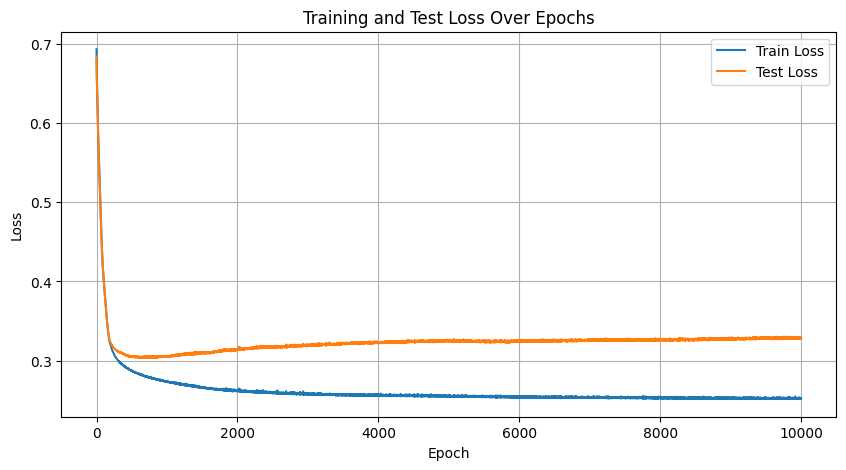

In [20]:
train(model, criterion, optimizers)

Layer (type:depth-idx)                   Output Shape              Param #
DiamondNN                                [43152, 2]                7
├─ModuleList: 1-3                        --                        --
│    └─BatchNorm1d: 2-1                  [43152, 14]               --
├─ModuleList: 1-4                        --                        (recursive)
│    └─Linear: 2-2                       [43152, 7]                105
├─ModuleList: 1-3                        --                        --
│    └─BatchNorm1d: 2-3                  [43152, 28]               --
├─ModuleList: 1-4                        --                        (recursive)
│    └─Linear: 2-4                       [43152, 14]               406
├─BatchNorm1d: 1-5                       [43152, 56]               --
├─Linear: 1-6                            [43152, 2]                114
Total params: 632
Trainable params: 632
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 26.97
Input size (MB): 1.21
Forward/

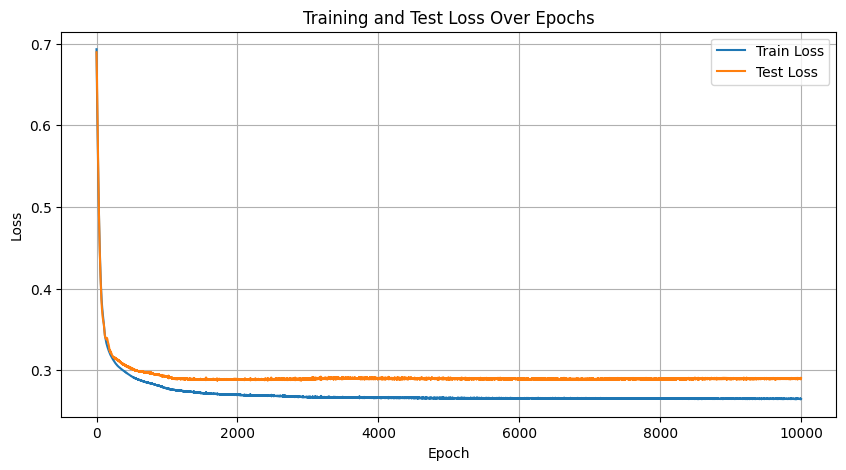

In [51]:
train(model, criterion, optimizers)

Layer (type:depth-idx)                   Output Shape              Param #
DiamondNN                                [43152, 2]                7
├─ModuleList: 1-1                        --                        --
│    └─Linear: 2-1                       [43152, 7]                105
│    └─Linear: 2-2                       [43152, 14]               406
├─Linear: 1-2                            [43152, 2]                114
Total params: 632
Trainable params: 632
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 26.97
Input size (MB): 1.21
Forward/backward pass size (MB): 7.94
Params size (MB): 0.00
Estimated Total Size (MB): 9.15
bias
Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0.], requires_grad=True)
linears.0.weight
Parameter containing:
tensor([[1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.,

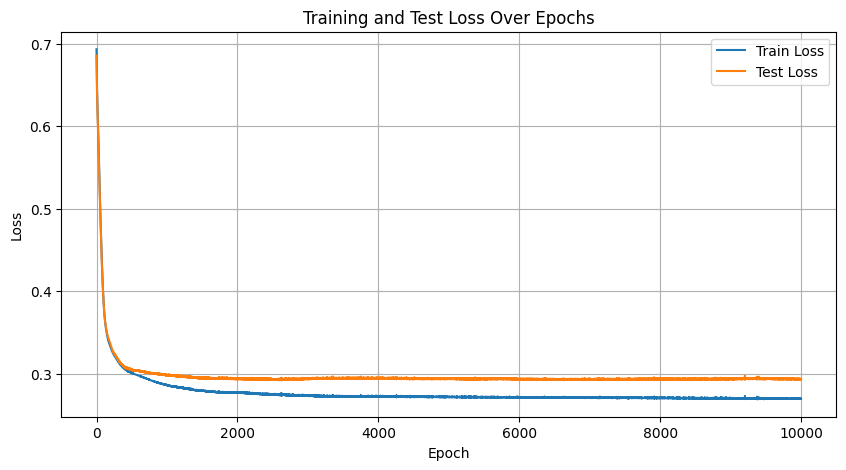

In [48]:
train(model, criterion, optimizers)

Layer (type:depth-idx)                   Output Shape              Param #
DiamondNN                                [43152, 2]                7
├─ModuleList: 1-1                        --                        --
│    └─Linear: 2-1                       [43152, 7]                105
│    └─Linear: 2-2                       [43152, 14]               406
├─Linear: 1-2                            [43152, 2]                114
Total params: 632
Trainable params: 632
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 26.97
Input size (MB): 1.21
Forward/backward pass size (MB): 7.94
Params size (MB): 0.00
Estimated Total Size (MB): 9.15
bias
Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0.], requires_grad=True)
linears.0.weight
Parameter containing:
tensor([[1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.,

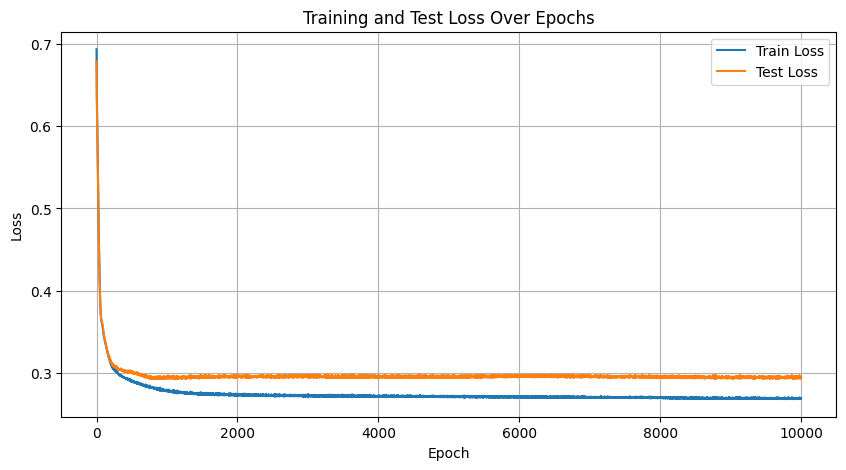

In [45]:
train(model, criterion, optimizers)

Layer (type:depth-idx)                   Output Shape              Param #
DiamondNN                                [43152, 2]                7
├─ModuleList: 1-1                        --                        --
│    └─Linear: 2-1                       [43152, 7]                105
│    └─Linear: 2-2                       [43152, 14]               406
├─Linear: 1-2                            [43152, 2]                114
Total params: 632
Trainable params: 632
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 26.97
Input size (MB): 1.21
Forward/backward pass size (MB): 7.94
Params size (MB): 0.00
Estimated Total Size (MB): 9.15
bias
Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0.], requires_grad=True)
linears.0.weight
Parameter containing:
tensor([[1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.,

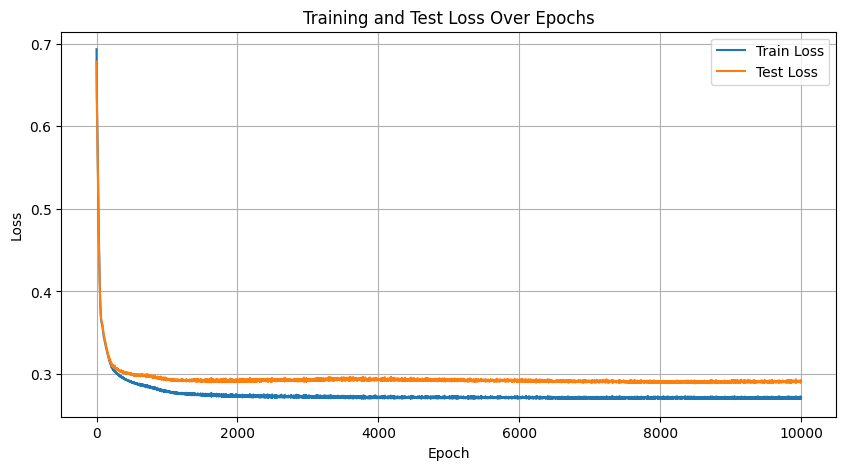

In [42]:
train(model, criterion, optimizers)

bias torch.Size([7])
linears.0.weight torch.Size([7, 14])
linears.0.bias torch.Size([7])
final.weight torch.Size([2, 28])
final.bias torch.Size([2])
Epoch 1/10000, Train Loss: 0.69314730, Test Loss: 0.68389922, Test Accuracy: 0.6151
Epoch 2/10000, Train Loss: 0.68404126, Test Loss: 0.67517251, Test Accuracy: 0.6179
Epoch 3/10000, Train Loss: 0.67545122, Test Loss: 0.66696519, Test Accuracy: 0.6209
Epoch 4/10000, Train Loss: 0.66737276, Test Loss: 0.65927571, Test Accuracy: 0.6252
Epoch 5/10000, Train Loss: 0.65980655, Test Loss: 0.65208107, Test Accuracy: 0.6315
Epoch 6/10000, Train Loss: 0.65272528, Test Loss: 0.64537573, Test Accuracy: 0.6371
Epoch 7/10000, Train Loss: 0.64612502, Test Loss: 0.63912874, Test Accuracy: 0.6478
Epoch 8/10000, Train Loss: 0.63997644, Test Loss: 0.63331443, Test Accuracy: 0.6555
Epoch 9/10000, Train Loss: 0.63424975, Test Loss: 0.62789661, Test Accuracy: 0.6642
Epoch 10/10000, Train Loss: 0.62891167, Test Loss: 0.62283093, Test Accuracy: 0.6726
Epoch 11/1

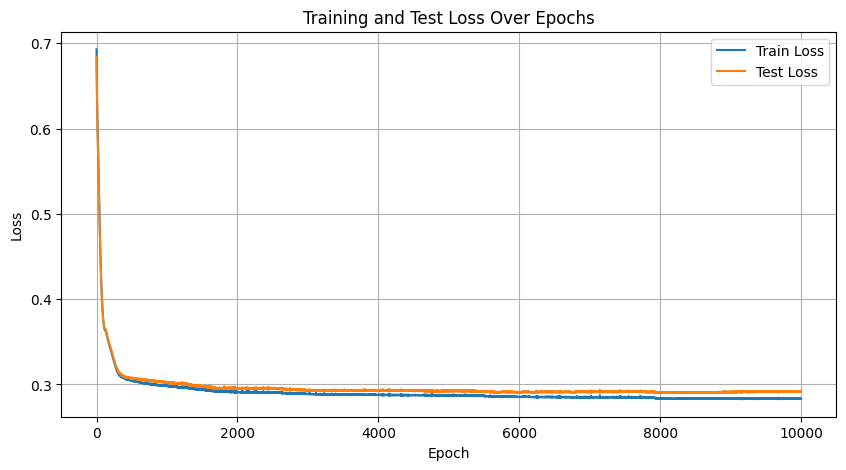

In [32]:
train(model, criterion, optimizers)

bias torch.Size([7])
linears.0.weight torch.Size([7, 14])
linears.0.bias torch.Size([7])
final.weight torch.Size([2, 28])
final.bias torch.Size([2])
Epoch 1/10000, Train Loss: 0.69314730, Test Loss: 0.69208646, Test Accuracy: 0.6022
Epoch 2/10000, Train Loss: 0.69178641, Test Loss: 0.69099998, Test Accuracy: 0.6022
Epoch 3/10000, Train Loss: 0.69041663, Test Loss: 0.68988246, Test Accuracy: 0.6022
Epoch 4/10000, Train Loss: 0.68903899, Test Loss: 0.68873346, Test Accuracy: 0.6022
Epoch 5/10000, Train Loss: 0.68765432, Test Loss: 0.68755245, Test Accuracy: 0.6022
Epoch 6/10000, Train Loss: 0.68626374, Test Loss: 0.68633896, Test Accuracy: 0.6022
Epoch 7/10000, Train Loss: 0.68486756, Test Loss: 0.68509287, Test Accuracy: 0.6022
Epoch 8/10000, Train Loss: 0.68346632, Test Loss: 0.68381351, Test Accuracy: 0.6022
Epoch 9/10000, Train Loss: 0.68206024, Test Loss: 0.68250281, Test Accuracy: 0.6022
Epoch 10/10000, Train Loss: 0.68064958, Test Loss: 0.68116182, Test Accuracy: 0.6022
Epoch 11/1

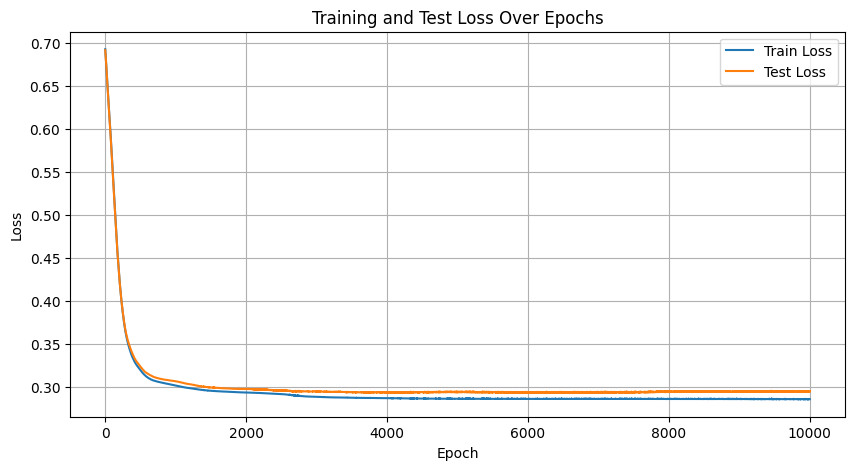

In [29]:
train(model, criterion, optimizers)

In [9]:
train(model, criterion, optimizer)

Layer (type:depth-idx)                   Output Shape              Param #
DiamondNN                                [464809, 2]               54
├─ModuleList: 1-1                        --                        --
│    └─BatchNorm1d: 2-1                  [464809, 108]             --
├─ModuleList: 1-2                        --                        --
│    └─Linear: 2-2                       [464809, 54]              5,886
├─BatchNorm1d: 1-3                       [464809, 216]             --
├─Linear: 1-4                            [464809, 1]               217
Total params: 6,157
Trainable params: 6,157
Non-trainable params: 0
Total mult-adds (Units.GIGABYTES): 2.84
Input size (MB): 100.40
Forward/backward pass size (MB): 204.52
Params size (MB): 0.02
Estimated Total Size (MB): 304.94
bias
Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,

IndexError: Target 2 is out of bounds.

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─DiamondNN: 1-1                         [43152, 2]                7
│    └─ModuleList: 2-1                   --                        --
│    │    └─BatchNorm1d: 3-1             [43152, 14]               --
│    └─ModuleList: 2-2                   --                        --
│    │    └─Linear: 3-2                  [43152, 7]                105
│    └─BatchNorm1d: 2-3                  [43152, 28]               --
│    └─Linear: 2-4                       [43152, 1]                29
Total params: 141
Trainable params: 141
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 5.78
Input size (MB): 1.21
Forward/backward pass size (MB): 2.76
Params size (MB): 0.00
Estimated Total Size (MB): 3.97
_orig_mod.bias
Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0.], requires_grad=True)
_orig_mod.linears.0.weight
Parameter containing:
ten

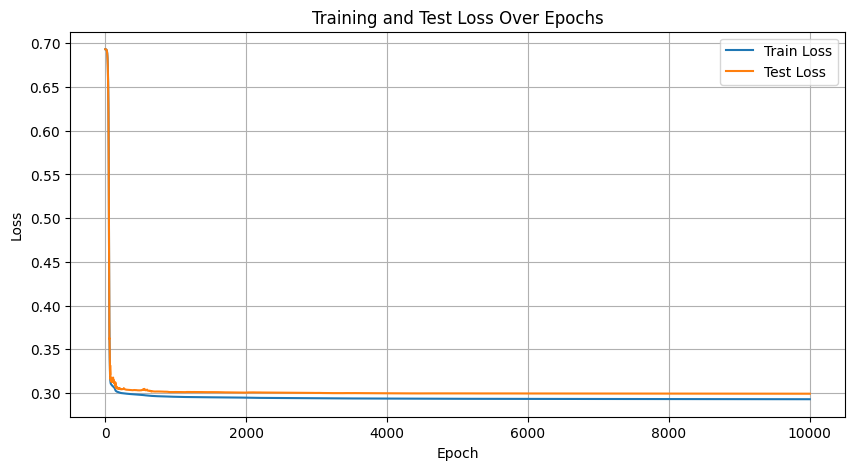

In [58]:
train(model, criterion, optimizer)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─DiamondNN: 1-1                         [43152, 2]                7
│    └─ModuleList: 2-5                   --                        --
│    │    └─BatchNorm1d: 3-1             [43152, 14]               --
│    └─ModuleList: 2-6                   --                        (recursive)
│    │    └─Linear: 3-2                  [43152, 7]                105
│    └─ModuleList: 2-5                   --                        --
│    │    └─BatchNorm1d: 3-3             [43152, 28]               --
│    └─ModuleList: 2-6                   --                        (recursive)
│    │    └─Linear: 3-4                  [43152, 14]               406
│    └─ModuleList: 2-5                   --                        --
│    │    └─BatchNorm1d: 3-5             [43152, 56]               --
│    └─ModuleList: 2-6                   --                       

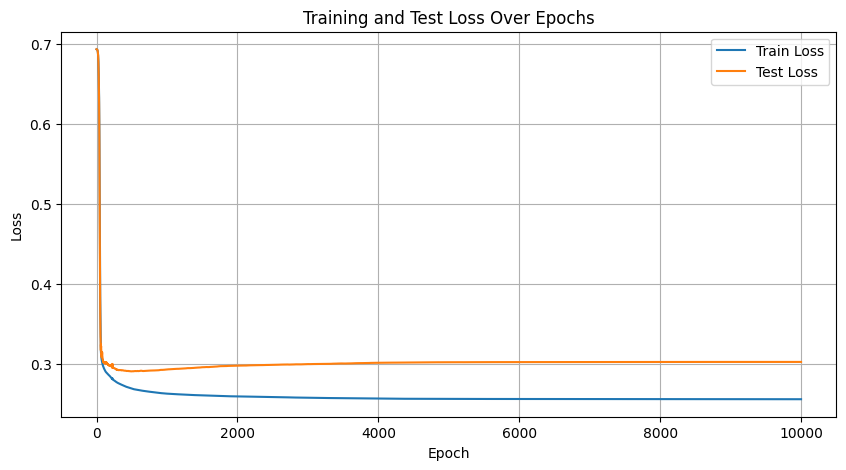

In [32]:
train(model, criterion, optimizer)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─DiamondNN: 1-1                         [43152, 2]                34,091
Total params: 34,091
Trainable params: 34,091
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.bias
Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0.], requires_grad=True)
_orig_mod.linears.0.weight
Parameter containing:
tensor([[1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.],
        [0., 0., 0.,

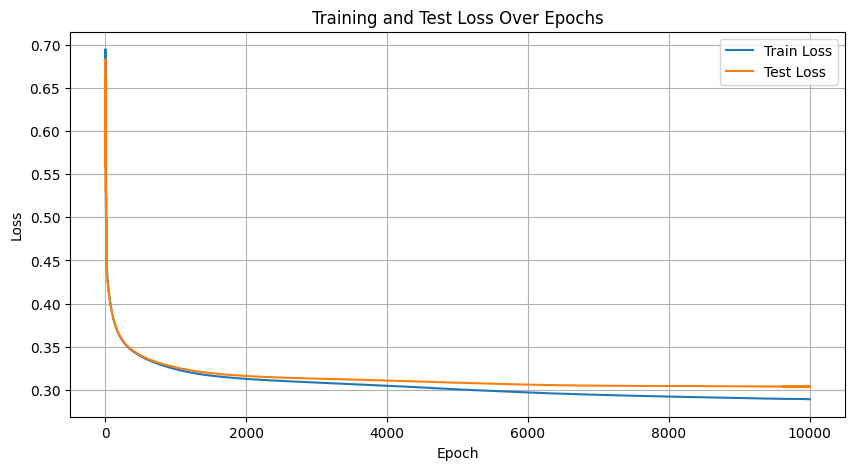

In [24]:
train(model, criterion, optimizer)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─DiamondNN: 1-1                         [43152, 2]                7
│    └─ModuleList: 2-5                   --                        --
│    │    └─BatchNorm1d: 3-1             [43152, 14]               --
│    └─ModuleList: 2-6                   --                        (recursive)
│    │    └─Linear: 3-2                  [43152, 7]                105
│    └─ModuleList: 2-5                   --                        --
│    │    └─BatchNorm1d: 3-3             [43152, 28]               --
│    └─ModuleList: 2-6                   --                        (recursive)
│    │    └─Linear: 3-4                  [43152, 14]               406
│    └─ModuleList: 2-5                   --                        --
│    │    └─BatchNorm1d: 3-5             [43152, 56]               --
│    └─ModuleList: 2-6                   --                       

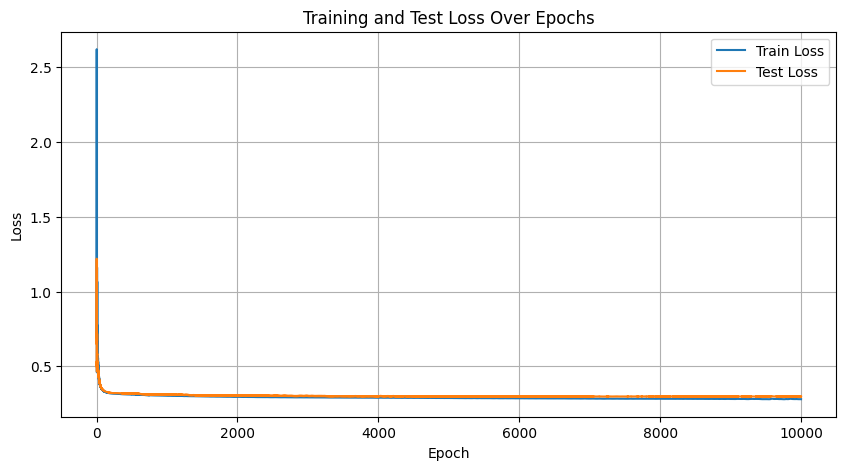

In [19]:
train(model, criterion, optimizer)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─DiamondNN: 1-1                         [43152, 2]                2,227
Total params: 2,227
Trainable params: 2,227
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.bias
Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0.], requires_grad=True)
_orig_mod.linears.0.weight
Parameter containing:
tensor([[1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.],
        [0., 0., 0., 0.

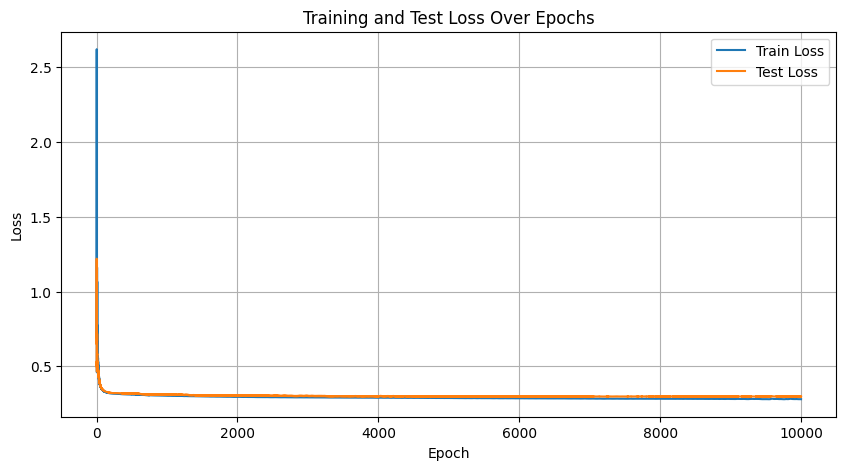

In [16]:
train(model, criterion, optimizer)